In [1]:
!pip install stanza ftfy beautifulsoup4 wordcloud nltk pandas openpyxl seaborn


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


Integrantes: 
- Felipe Nuñez Pinillos - 202021673 
- Juan Manuel Pérez Sánchez - 202021827

# Analisis Exploratorio - Justicia Escolar Restaurativa


## 0. Carga inicial

In [2]:
from pathlib import Path
import os

data_experiencias = Path("datos/institucionales/experiencias/compiled_experiencias.txt").read_text(encoding="utf-8")

data_manuales = Path("datos/institucionales/manuales/compiled_manuales_convivencia.txt").read_text(encoding="utf-8")

documentos_path = Path("datos/institucionales/documentos_institucionales")
data_documentos_institucionales = ""

for file_path in documentos_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_documentos_institucionales += f"\n\n{content}"

In [3]:
entrevistas_path = Path("datos/entrevistas")

# 1. Estudiantes
data_estudiantes = ""
estudiantes_path = entrevistas_path / "estudiantes"
for file_path in estudiantes_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_estudiantes += f"\n{content}"

# 2. Anexo Estudiantes  
data_anexo_estudiantes = ""
anexo_path = entrevistas_path / "anexo_estudiantes"
for file_path in anexo_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_anexo_estudiantes += f"\n{content}"

# 3. Directivos
data_directivos = ""
directivos_path = entrevistas_path / "directivos"
for file_path in directivos_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_directivos += f"\n{content}"

# 4. Docentes
data_docentes = ""
docentes_path = entrevistas_path / "docentes"
for file_path in docentes_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_docentes += f"\n{content}"

# 5. Familia
data_familia = ""
familia_path = entrevistas_path / "familia"
for file_path in familia_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_familia += f"\n{content}"

# 6. SED (Secretaría de Educación)
data_sed = ""
sed_path = entrevistas_path / "sed"
for file_path in sed_path.glob("*.txt"):
    content = file_path.read_text(encoding="utf-8")
    data_sed += f"\n{content}"


## 1. NER

Comenzamos con un NER (Named Entity Recognition) es una técnica que extrae entidades mencionadas en un texto y las clasifica por tipo. En este caso para realizar este análisis utilizamos la librería de la Universidad de Stanford (Stanza), esta libreria nos ofrece las siguientes caracteristicas PER (persona), LOC (lugar), ORG (organización), MISC (miscelánea). El resultado de esta técnica se guardó en diferentes archivos JSON, dado que este análisis consume recursos computacionales.


### 1.1 Implementación

In [4]:
import stanza

stanza.download("es")


2025-10-21 17:22:04 INFO: Downloaded file to /home/juanperez/stanza_resources/resources.json
2025-10-21 17:22:04 INFO: Downloading default packages for language: es (Spanish) ...
2025-10-21 17:22:06 INFO: File exists: /home/juanperez/stanza_resources/es/default.zip
2025-10-21 17:22:12 INFO: Finished downloading models and saved to /home/juanperez/stanza_resources


In [5]:
nlp = stanza.Pipeline(lang="es", processors="tokenize,mwt,ner")

2025-10-21 17:22:12 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


2025-10-21 17:22:12 INFO: Downloaded file to /home/juanperez/stanza_resources/resources.json
2025-10-21 17:22:13 INFO: Loading these models for language: es (Spanish):
| Processor | Package  |
------------------------
| tokenize  | combined |
| mwt       | combined |
| ner       | conll02  |

2025-10-21 17:22:13 INFO: Using device: cpu
2025-10-21 17:22:13 INFO: Loading: tokenize
2025-10-21 17:22:14 INFO: Loading: mwt
2025-10-21 17:22:14 INFO: Loading: ner
2025-10-21 17:22:16 INFO: Done loading processors!


In [6]:
# Function to extract named entities from text
def extract_entities(text):
    """
    Extract named entities from text using Stanza NER

    """
    # Process with Stanza
    doc = nlp(text)
    
    entities = []
    for sentence in doc.sentences:
        for entity in sentence.ents:
            entities.append({
                'text': entity.text,
                'label': entity.type,
                'start': entity.start_char,
                'end': entity.end_char
            })
    
    return entities

all_entities = {}

In [7]:
print("1. Analizando experiencias...")
entities_experiencias = extract_entities(data_experiencias)
all_entities['experiencias'] = entities_experiencias
print(f"   Encontradas {len(entities_experiencias)} entidades")

1. Analizando experiencias...
   Encontradas 4289 entidades


In [8]:
print("2. Analizando manuales...")
entities_manuales = extract_entities(data_manuales)
all_entities['manuales'] = entities_manuales
print(f"   Encontradas {len(entities_manuales)} entidades")

2. Analizando manuales...
   Encontradas 7948 entidades


In [9]:
print("3. Analizando documentos institucionales...")
entities_documentos = extract_entities(data_documentos_institucionales)
all_entities['documentos_institucionales'] = entities_documentos
print(f"   Encontradas {len(entities_documentos)} entidades")

3. Analizando documentos institucionales...
   Encontradas 4935 entidades


In [10]:
print("4. Analizando entrevistas estudiantes...")
entities_estudiantes = extract_entities(data_estudiantes)
all_entities['estudiantes'] = entities_estudiantes
print(f"   Encontradas {len(entities_estudiantes)} entidades")


4. Analizando entrevistas estudiantes...
   Encontradas 1821 entidades


In [11]:
print("5. Analizando anexo estudiantes...")
entities_anexo_estudiantes = extract_entities(data_anexo_estudiantes)
all_entities['anexo_estudiantes'] = entities_anexo_estudiantes
print(f"   Encontradas {len(entities_anexo_estudiantes)} entidades")

5. Analizando anexo estudiantes...
   Encontradas 890 entidades


In [12]:
print("6. Analizando entrevistas directivos...")
entities_directivos = extract_entities(data_directivos)
all_entities['directivos'] = entities_directivos
print(f"   Encontradas {len(entities_directivos)} entidades")

6. Analizando entrevistas directivos...
   Encontradas 1187 entidades


In [13]:
print("7. Analizando entrevistas docentes...")
entities_docentes = extract_entities(data_docentes)
all_entities['docentes'] = entities_docentes
print(f"   Encontradas {len(entities_docentes)} entidades")

7. Analizando entrevistas docentes...
   Encontradas 1403 entidades


In [14]:
print("8. Analizando entrevistas familia...")
entities_familia = extract_entities(data_familia)
all_entities['familia'] = entities_familia
print(f"   Encontradas {len(entities_familia)} entidades")

8. Analizando entrevistas familia...
   Encontradas 1038 entidades


In [15]:
print("9. Analizando entrevistas SED...")
entities_sed = extract_entities(data_sed)
all_entities['sed'] = entities_sed
print(f"   Encontradas {len(entities_sed)} entidades")

9. Analizando entrevistas SED...
   Encontradas 429 entidades


In [16]:
import json
from pathlib import Path
import re

def _safe_name(name: str, max_len: int = 60) -> str:
    """
    Limpia el nombre para usarlo como nombre de archivo/hoja.
    Reemplaza caracteres no alfanuméricos por '_', y recorta longitud.
    """
    name = name or "sin_nombre"
    name = re.sub(r"[^A-Za-z0-9\-_]+", "_", str(name))
    return name[:max_len].strip("_") or "sin_nombre"

def save_all_entities_json(all_entities: dict, out_dir: str | Path = "export_entities_json"):
    """
    Guarda:
      - export_entities_json/all_entities.json  (diccionario completo)
      - export_entities_json/<grupo>.json       (lista completa de entidades del grupo)
      - export_entities_json/<grupo>.ndjson     (misma lista en formato NDJSON)
      - export_entities_json/entities_global.ndjson (todas las entidades, aplanadas)
    """
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    # 1) Diccionario completo
    all_json_path = out_dir / "all_entities.json"
    with all_json_path.open("w", encoding="utf-8") as f:
        json.dump(all_entities, f, ensure_ascii=False, indent=2, sort_keys=True)

    # 2) Por grupo: JSON y NDJSON
    global_count = 0
    ndjson_global_path = out_dir / "entities_global.ndjson"
    with ndjson_global_path.open("w", encoding="utf-8") as f_global:
        for group_name, entities in (all_entities or {}).items():
            safe = _safe_name(group_name)
            group_json_path = out_dir / f"{safe}.json"
            group_ndjson_path = out_dir / f"{safe}.ndjson"

            # JSON (lista completa)
            with group_json_path.open("w", encoding="utf-8") as f_json:
                json.dump(entities, f_json, ensure_ascii=False, indent=2, sort_keys=True)

            # NDJSON (una entidad por línea)
            with group_ndjson_path.open("w", encoding="utf-8") as f_ndjson:
                for e in entities or []:
                    f_ndjson.write(json.dumps(e, ensure_ascii=False, sort_keys=True) + "\n")

            # Escribir también en el global.ndjson
            for e in entities or []:
                f_global.write(json.dumps(
                    {"__group__": group_name, **(e or {})},
                    ensure_ascii=False, sort_keys=True
                ) + "\n")
                global_count += 1

    print(f"✅ Guardado JSON completo en: {all_json_path.resolve()}")
    print(f"✅ Guardados JSON/NDJSON por grupo en: {out_dir.resolve()}")
    print(f"✅ Global NDJSON ({global_count} entidades): {ndjson_global_path.resolve()}")

# === USO ===
save_all_entities_json(all_entities, "export_entities_json")


✅ Guardado JSON completo en: /home/juanperez/Developer/Personal/Proyecto/export_entities_json/all_entities.json
✅ Guardados JSON/NDJSON por grupo en: /home/juanperez/Developer/Personal/Proyecto/export_entities_json
✅ Global NDJSON (23940 entidades): /home/juanperez/Developer/Personal/Proyecto/export_entities_json/entities_global.ndjson


### 1.2. Analisis

#### 1.2.1. Analisis macro

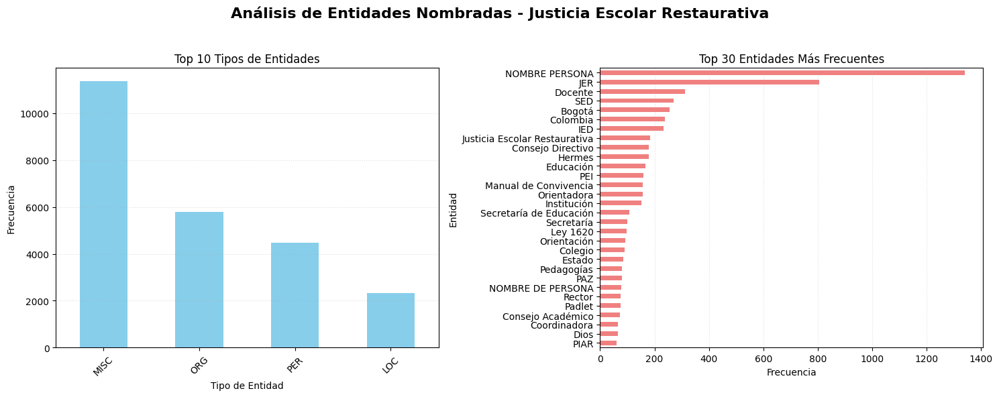

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Convertir todas las entidades a un DataFrame para análisis
all_entities_list = []
for group_name, entities in all_entities.items():
    for entity in entities:
        all_entities_list.append({
            'group': group_name,
            'text': entity['text'],
            'label': entity['label'],
            'start': entity['start'],
            'end': entity['end']
        })
df_entities = pd.DataFrame(all_entities_list)

# Si no hay datos, evita fallos
if df_entities.empty:
    raise ValueError("No hay entidades en 'all_entities' para graficar.")

plt.style.use('default')
fig, axes = plt.subplots(1, 2, figsize=(15, 6))  # alto más razonable para 1x2
fig.suptitle('Análisis de Entidades Nombradas - Justicia Escolar Restaurativa', fontsize=16, fontweight='bold')

# 1. Top 10 tipos de entidades
ax1 = axes[0]
entity_type_counts = df_entities['label'].value_counts().head(10)
entity_type_counts.plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_title('Top 10 Tipos de Entidades')
ax1.set_xlabel('Tipo de Entidad')
ax1.set_ylabel('Frecuencia')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', linestyle=':', alpha=0.4)

# 2. Top 30 entidades por frecuencia (orden ascendente para barh)
ax2 = axes[1]
top_entities = df_entities['text'].value_counts().head(30).sort_values(ascending=True)
top_entities.plot(kind='barh', ax=ax2, color='lightcoral')
ax2.set_title('Top 30 Entidades Más Frecuentes')
ax2.set_xlabel('Frecuencia')
ax2.set_ylabel('Entidad')
ax2.grid(axis='x', linestyle=':', alpha=0.4)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # deja espacio al título
plt.show()


La figura de NER para todo el corpus muestra, a la izquierda, la distribución por tipo de entidad y, a la derecha, el ranking de las 30 entidades más frecuentes. Predomina claramente la etiqueta MISC, seguida por ORG y PER, mientras que LOC es la menos representada. En el ranking sobresale el placeholder de anonimización “NOMBRE PERSONA”, y luego aparecen “JER/Justicia Escolar Restaurativa” y múltiples términos institucionales o de rol: Docente, SED/Secretaría de Educación, PEI, Manual de Convivencia, Consejo Directivo, Rector, Coordinador, Orientadora, Pedagogas, entre otros.

A partir de esa evidencia directa se infiere que el corpus está fuertemente anclado en un discurso institucional y normativo. La alta proporción de MISC y la presencia sostenida de instituciones, documentos y siglas en el top sugieren que una parte importante de los textos proviene de materiales formales (orientaciones, manuales, lineamientos) o, al menos, que el habla de las entrevistas remite con frecuencia a esos marcos. Al mismo tiempo, el foco recae más en funciones y equipos que en individuos concretos: términos como Docente, Rector, Coordinador u Orientadora se repiten con mucha más frecuencia que nombres propios, y el primer lugar del ranking es precisamente un token de anonimización, lo que confirma que la base está cuidadosamente desidentificada y que las narrativas se refieren a roles.También se observa una presencia nítida del marco restaurativo: “JER/Justicia Escolar Restaurativa”, “Manual de Convivencia”, “Consejo Directivo” y “PEI” figuran entre las menciones más comunes.

In [71]:
source_entity_matrix = df_entities.pivot_table(
    index='group',
    columns='label',
    values='text',
    aggfunc='count',
    fill_value=0
)

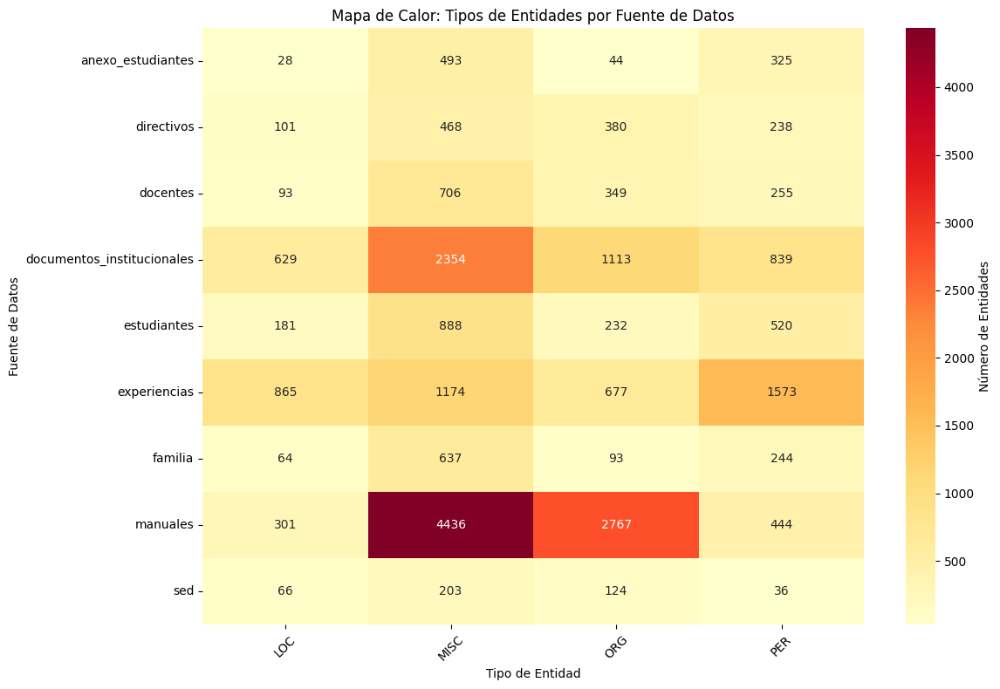

In [73]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(source_entity_matrix, annot=True, fmt='d', cmap='YlOrRd', cbar_kws={'label': 'Número de Entidades'})
plt.title('Mapa de Calor: Tipos de Entidades por Fuente de Datos')
plt.xlabel('Tipo de Entidad')
plt.ylabel('Fuente de Datos')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Ahora bien, entrando un poco más a detalle en los distintos tipos de archivos de documentos podemos observar el mapa de calor de entidades por fuente de datos en este caso. La gráfica sugiere la siguiente distribución para manuales que concentra el mayor volumen de entidades, dominado por MISC  y ORG. Mientras que experiencias destaca por PER y también aporta LOC, coherente con relatos personales. En el caso de  documentos institucionales se muestran altos MISC  y ORG. En estudiantes se ve un volumen medio con dominancia de PER y bastante MISC. Los docentes dominan MISC y ORG. En directivos aparece más equilibrado (MISC/ORG/PER similares), reflejando menciones a organizaciones y puestos jerárquicos. En las entrevistas de familia pesa más PER, acorde con nombres de acudientes y roles familiares. Mientras que en sed se concentra ORG y MISC, probablemente repitiendo la entidad institucional y lineamientos. Por último, anexo_estudiantes también es de bajo volumen pero con PER relativamente alto.

#### 1.2.2. Analisis Micro

##### 1.2.2.1. Implementación

In [77]:
import math
from typing import Optional, List

def _shorten(s: str, n: int = 40) -> str:
    s = str(s)
    return s if len(s) <= n else s[:n-1] + "…"

def plot_top_entities_by_label(
    df_entities: pd.DataFrame,
    source: str,
    *,
    top_n: int = 20,
    max_labels_per_fig: Optional[int] = None,
    only_labels: Optional[List[str]] = None,
    cols: int = 3,
    fig_w: float = 6.0,
    fig_h: float = 4.5,
    title_prefix: str = "Top entidades por etiqueta"
):
    """
    Creates barh subplots for the most frequent 'text' within each 'label'
    for a given 'source'.

    Parameters
    ----------
    df_entities : DataFrame with ['source','label','text'] (and optionally others).
    source      : Source name to plot (e.g., 'experiencias').
    top_n       : Entities per label (default 20).
    max_labels_per_fig : Cap how many labels to plot in this figure.
    only_labels : If provided, plot only these labels (in this order if present).
    cols        : Number of subplot columns.
    fig_w, fig_h: Base width/height per column/row.
    title_prefix: Figure suptitle prefix.

    Returns
    -------
    (fig, axes): Matplotlib Figure and 1D array of Axes.
    """

    # Counts by (group, label, text)
    counts = (
        df_entities
        .groupby(['group', 'label', 'text'], dropna=False)
        .size()
        .reset_index(name='freq')
    )

    # Filter group
    df_src = counts[counts['group'] == source].copy()
    if df_src.empty:
        raise ValueError(f"No data for group '{source}'.")

    # Label order by total frequency, then optionally restricted
    label_order = (
        df_src.groupby('label', dropna=False)['freq']
        .sum()
        .sort_values(ascending=False)
        .index
        .tolist()
    )
    if only_labels:
        label_order = [l for l in only_labels if l in label_order]

    if max_labels_per_fig is not None:
        label_order = label_order[:max_labels_per_fig]

    n_labels = len(label_order)
    if n_labels == 0:
        raise ValueError(f"No labels with freq > 0 for source '{source}' given the filters.")

    cols = max(1, min(cols, n_labels))
    rows = math.ceil(n_labels / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w*cols, fig_h*rows))
    if isinstance(axes, plt.Axes):
        axes = [axes]
    else:
        axes = axes.flatten()

    fig.suptitle(f"{title_prefix} — {source}", fontsize=14, fontweight='bold')

    # Plot per label
    for i, label in enumerate(label_order):
        ax = axes[i]
        df_lab = (
            df_src[df_src['label'] == label]
            .sort_values('freq', ascending=False)
            .head(top_n)
            .sort_values('freq', ascending=True)  # for barh ascending
            .copy()
        )
        if df_lab.empty:
            ax.set_visible(False)
            continue

        df_lab['text_short'] = df_lab['text'].apply(_shorten)

        sns.barplot(
            data=df_lab,
            x='freq', y='text_short',
            color='steelblue', ax=ax
        )
        ax.set_title(f"{label} (Top {min(top_n, len(df_lab))})", fontsize=12)
        ax.set_xlabel("Frecuencia")
        ax.set_ylabel("Entidad")
        ax.grid(axis='x', linestyle=':', alpha=0.4)

        # numeric labels at bar ends
        for p in ax.patches:
            w = p.get_width()
            y = p.get_y() + p.get_height()/2
            ax.text(w + max(0.5, 0.01*w), y, f"{int(w)}", va='center', fontsize=9)

    # Hide extra subplots
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()


##### 1.2.2.2. Analisis Experiencias

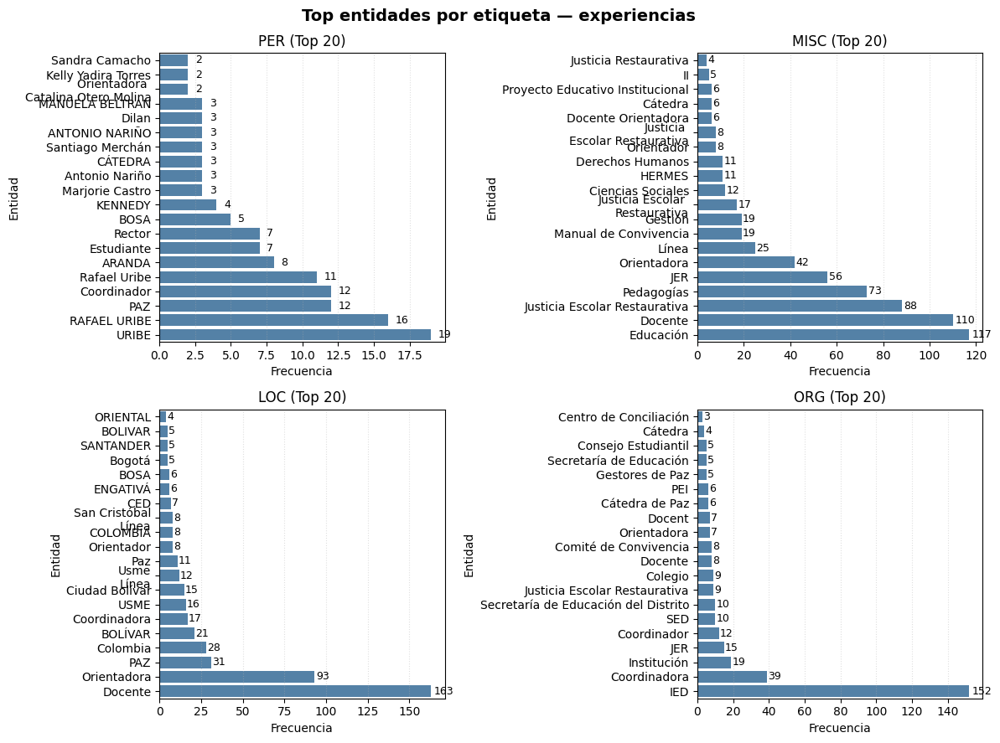

In [79]:
plot_top_entities_by_label(df_entities, "experiencias", top_n=20, max_labels_per_fig=None, cols=2)

En las experiencias se observa un discurso fuertemente institucional y pedagógico: en MISC lideran Educación y Docente y en ORG domina IED junto a JER/Justicia Escolar Restaurativa, SED, comités/consejos y cátedra/gestores de paz, lo que indica alta presencia del marco restaurativo. En PER resaltan roles (Docente, Orientadora, Coordinador, Rector, Estudiante) por encima de nombres propios, por lo que hay potencia para comparativas por actor.

##### 1.2.2.3. Analisis Manuales

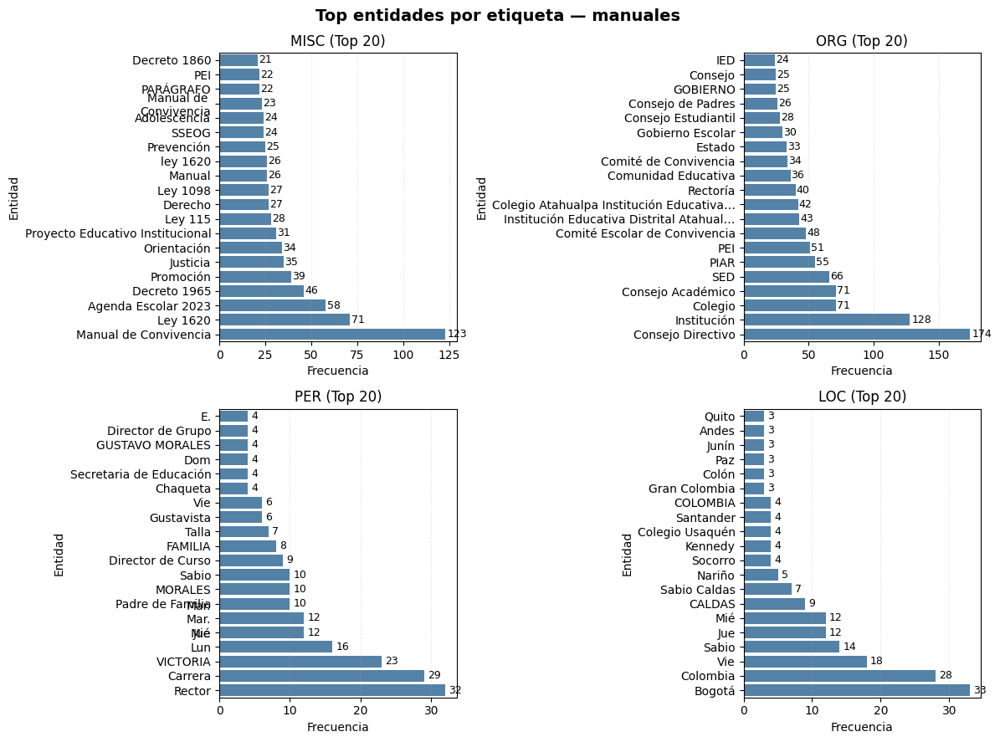

In [80]:
plot_top_entities_by_label(df_entities, "manuales", top_n=20, max_labels_per_fig=None, cols=2)

En los manuales, las entidades muestran un claro sesgo normativo-institucional. En MISC destacan Manual de Convivencia, Ley 1620, Decreto 1965 y Agenda Escolar 2023, lo que evidencia que el corpus se apoya en marcos legales y lineamientos vigentes. En ORG sobresalen órganos de gobernanza escolar como Consejo Directivo, Institución/Colegio, Consejo Académico, SED, PIAR y los Comités (Escolar/Convivencia), sugiriendo documentos centrados en procedimientos, responsabilidades y estructura de gobierno. En LOC predomina Bogotá y referencias generales a Colombia, con pocas localidades específicas, lo que apunta a un anclaje territorial amplio más que micro-local. En PER aparecen sobre todo roles (p. ej., Rector, Director de Curso, Padre de Familia), coherentes con textos que definen funciones y actores. Las frecuencias reflejan prácticas y lineamientos de convivencia en clave de cumplimiento y gobierno escolar, más que narrativas experienciales.

##### 1.2.2.4. Documentos institucionales

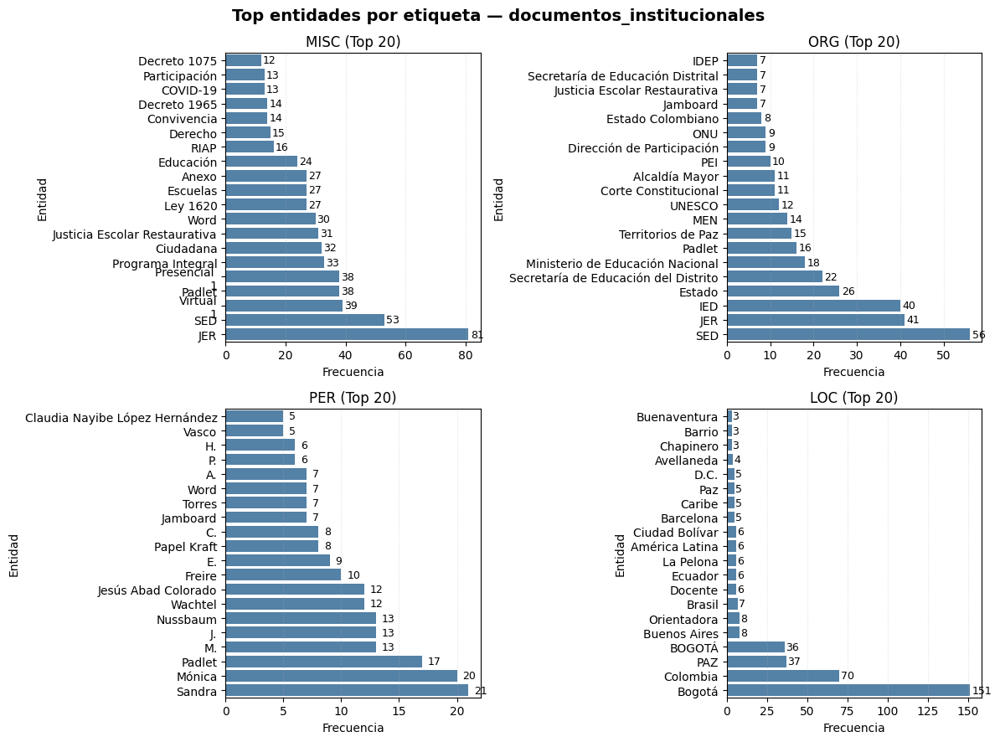

In [81]:
plot_top_entities_by_label(df_entities, "documentos_institucionales", top_n=20, max_labels_per_fig=None, cols=2)

En los documentos institucionales, las entidades reflejan un marco político-noramtivo claro. En MISC predominan referencias a la JER/Justicia Escolar Restaurativa y a la SED, junto con Ley 1620, Decreto 1965/1075, Programa Integral, Ciudadana y modalidades virtual/presencial, lo que perfila textos de lineamiento y operación del enfoque. En ORG sobresalen SED, JER, IED, Estado/Secretaría de Educación del Distrito, MEN/Ministerio de Educación, Alcaldía Mayor, e incluso organismos ONU/UNESCO y Territorios de Paz, señalando anclaje institucional fuerte y validación normativa internacional. En LOC el anclaje es marcadamente distrital/nacional —Bogotá y Colombia— con menciones puntuales a localidades (p. ej., Chapinero, Ciudad Bolívar) y países de referencia, lo que sugiere difusión de políticas desde el nivel central hacia escuelas. En PER aparecen tanto roles/nombres propios. Las frecuencias apuntan a documentos que institucionalizan la convivencia y la justicia restaurativa mediante marcos legales y coordinación interinstitucional, con foco territorial en Bogotá y proyección nacional.

##### 1.2.2.5. Analisis entrevistas estudiantes

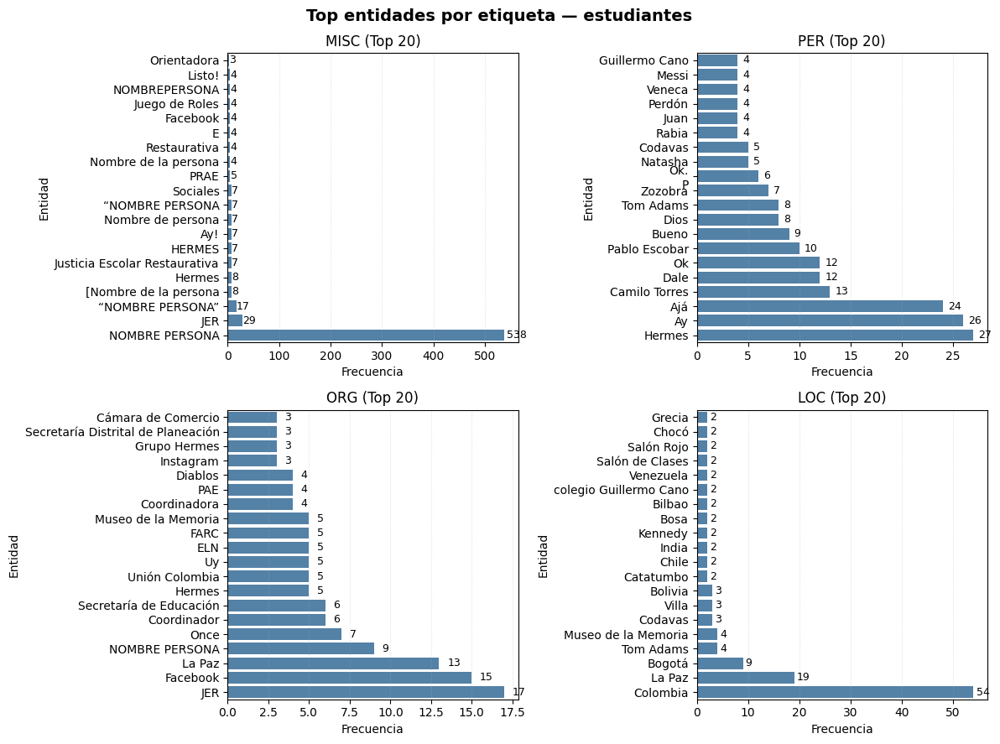

In [82]:
plot_top_entities_by_label(df_entities, "estudiantes", top_n=20, max_labels_per_fig=None, cols=2)

En las entrevistas de estudiantes el NER revela un patrón mucho más conversacional que normativo. En MISC dominan marcadores y placeholders como “NOMBRE PERSONA”, variantes (“NOMBREPERSONA”, [Nombre de la persona]), y expresiones de oralidad (“Ay”, “Listo”), junto con menciones al enfoque (JER/Justicia Escolar Restaurativa) y a plataformas (Facebook), lo que indica fuerte ruido de transcripción y de la propia librería. En PER se mezclan interjecciones (“Ay”, “Ajá”, “Ok”) y apodos/antropónimos (p. ej., Hermes, Camilo Torres), además de referentes mediáticos (Messi, Pablo Escobar) y autores (Tom Adams), reflejando relatos espontáneos con nombres propios y culturales. En ORG aparecen tanto instancias educativas (Secretaría de Educación, Coordinador/a) como colectivos y redes sociales (Grupo Hermes, Facebook, Instagram, Unión Colombia), otra señal de mezcla entre instituciones reales y referentes del habla cotidiana. En LOC prevalecen Colombia, Bogotá y La Paz (probablemente como topónimo y/o concepto), con lugares anecdóticos (Salón de Clases, Museo de la Memoria), lo que muestra anclaje territorial general más que micro-local. En conjunto, las frecuencias apuntan a testimonios centrados en casos y personas concretas con alta oralidad y referencias culturales, útiles para comprender la experiencia estudiantil. 

##### 1.2.2.6. Anexo Estudiantes

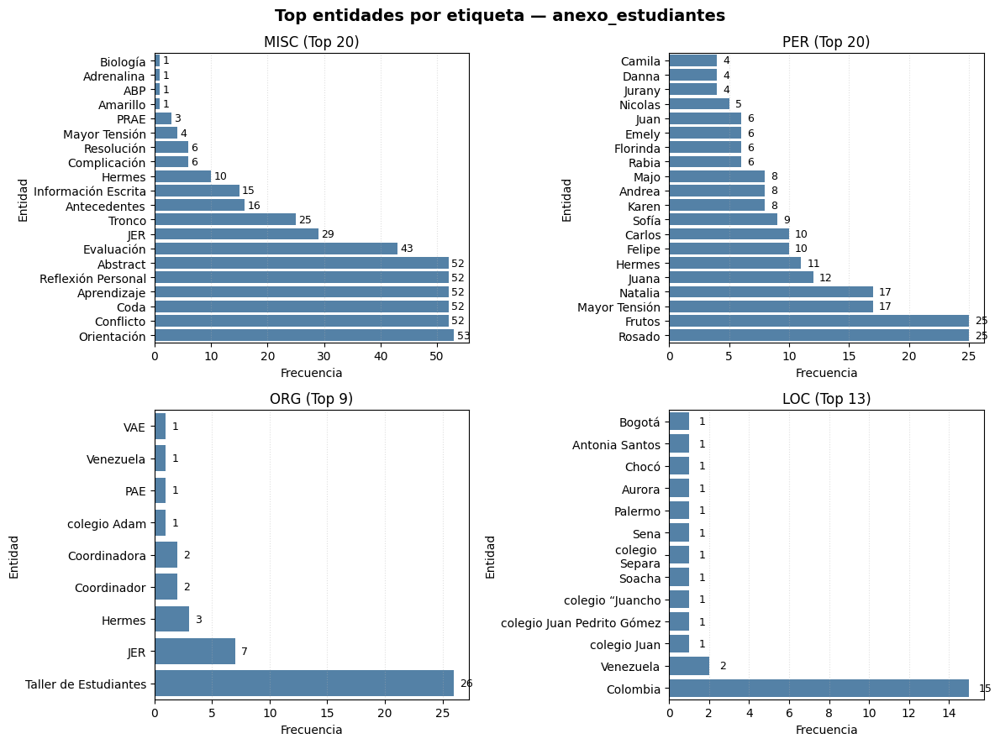

In [83]:
plot_top_entities_by_label(df_entities, "anexo_estudiantes", top_n=20, max_labels_per_fig=None, cols=2)

En el anexo de estudiantes las entidades evidencian materiales didácticos y de taller más que marcos normativos. En MISC dominan conceptos de guía pedagógica como Orientación, Conflicto, Aprendizaje, Reflexión Personal, Abstract, Coda, Evaluación, Tronco, Antecedentes, Información Escrita junto con JER y menciones a PRAE/Hermes, lo que sugiere instrumentos para conducir actividades y reportes con estructura de análisis y cierre. En ORG sobresale Taller de Estudiantes (muy por encima del resto), seguido de JER, Hermes y Coordinador/a, señalando que el trabajo se organiza en espacios formativos con acompañamiento institucional. En PER prevalecen nombres propios de estudiantes (p. ej., Rosado, Frutos, Natalia, Juana, Carlos, Felipe), lo que indica enfoque individual. En LOC el anclaje es macro Colombia y, en menor medida, Venezuela  con escasas referencias microterritoriales (nombres de colegios puntuales). En conjunto, el anexo retrata actividades centradas en práctica y reflexión personal dentro de talleres estudiantiles vinculados al enfoque restaurativo, con fuerte énfasis en casos individuales y baja especificidad geográfica.

##### 1.2.2.7. Analisis Directivos

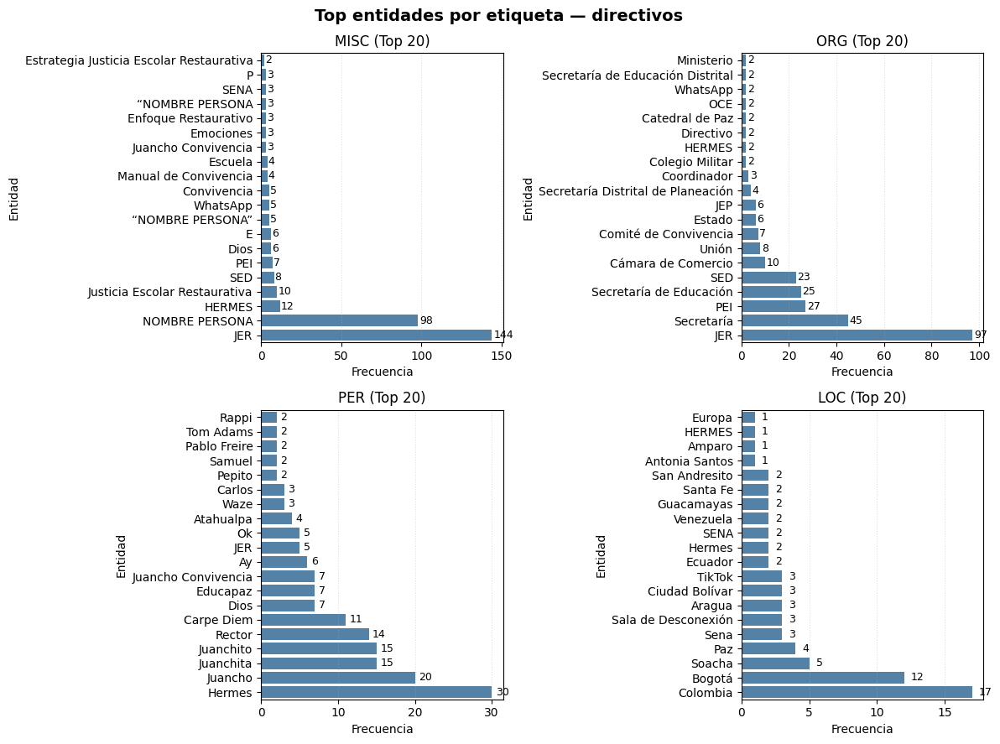

In [84]:
plot_top_entities_by_label(df_entities, "directivos", top_n=20, max_labels_per_fig=None, cols=2)

En directivos, se observa un discurso institucional-operativo. En MISC predominan JER y HERMES, junto con SED, PEI, Manual de Convivencia y marcas de implementación (WhatsApp, Enfoque/estrategia restaurativa), lo que sugiere foco en lineamientos y herramientas de gestión; no obstante, hay placeholders como NOMBRE PERSONA que introducen ruido. En ORG sobresale JER (muy por encima del resto) y luego Secretaría/SED, PEI, Comité de Convivencia, Cámara de Comercio y entidades distritales/nacionales (p. ej., Secretaría de Educación, JEP), reflejando gobernanza escolar y articulación interinstitucional. En PER se mezclan cargos y nombres propios (Rector, Hermes, Juancho/Juanchita/Juanchito) con interjecciones (Ay, Ok) y marcas/organizaciones mal clasificadas como persona (Educapaz, Waze, Rappi), señal clara de errores de etiquetado en habla espontánea. En LOC el anclaje es Colombia/Bogotá con menciones a Soacha y localidades barriales, pero también aparecen términos y plataformas mal detectados como lugar (TikTok, Paz, Sala de Desconexión, HERMES). En conjunto, las frecuencias muestran que los directivos narran la convivencia desde políticas, órganos y procedimientos (JER–SED–PEI–Comités), con referencias territoriales del nivel distrito.

##### 1.2.2.8 Analisis Docentes

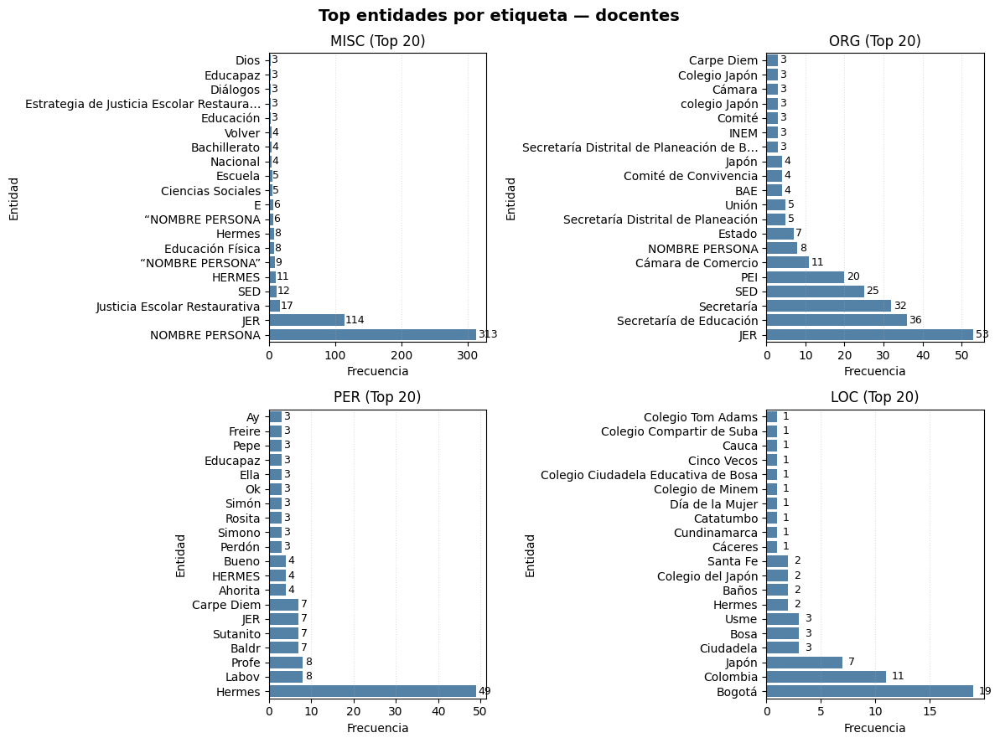

In [85]:
plot_top_entities_by_label(df_entities, "docentes", top_n=20, max_labels_per_fig=None, cols=2)

Para los corpus de docentes en MISC dominan NOMBRE PERSONA (placeholder de anonimización) y siglas del enfoque (JER, Justicia Escolar Restaurativa, SED, HERMES), junto a rótulos pedagógicos (Educación Física, Ciencias Sociales, Diálogos), lo que perfila relatos de aula articulados explícitamente al marco restaurativo y a asignaturas. En ORG sobresalen JER, Secretaría de Educación/SED, PEI, Comité de Convivencia y Cámara de Comercio (alianzas), señal de que el profesorado ubica la convivencia dentro de la gobernanza escolar y de convenios externos. En PER se mezclan roles y nombres propios (p. ej., Profe, Hermes) con autores de referencia (Labov, Freire) y muletillas/interjecciones (Ay, Ok, Ahorita), evidenciando un discurso práctico. En LOC predomina el anclaje distrital/nacional (Bogotá, Colombia). En conjunto, las frecuencias muestran a los docentes narrando la convivencia desde procedimientos de aula y marco restaurativo institucional, con referencias a actores y órganos escolares y algunos autores pedagógicos.

##### 1.2.2.9. Analisis familia

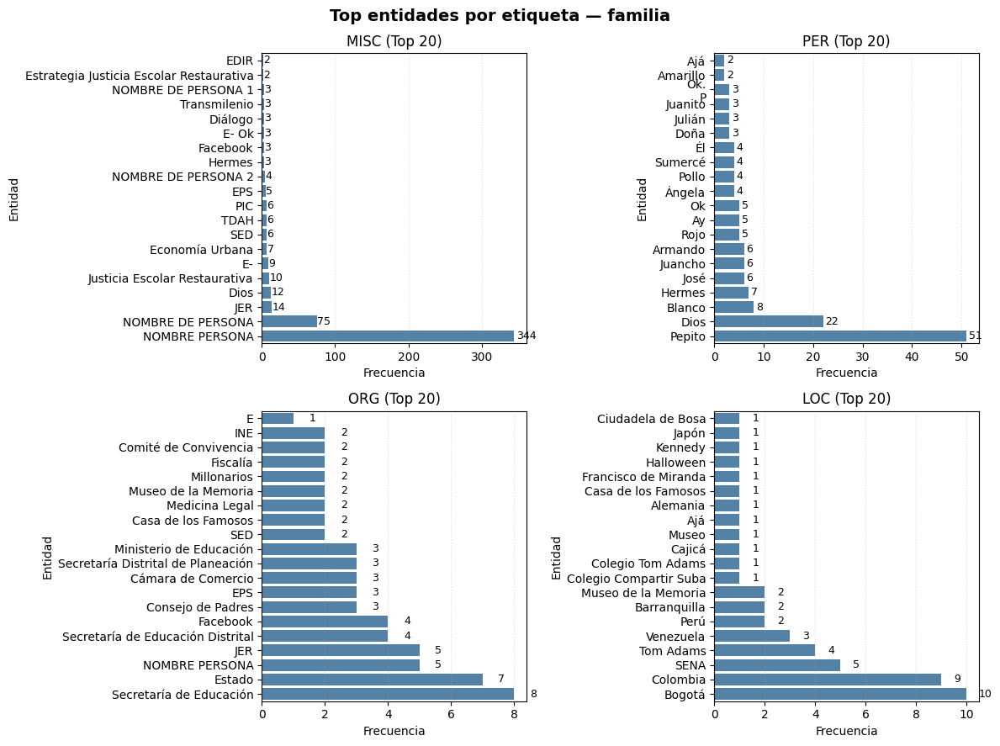

In [86]:
plot_top_entities_by_label(df_entities, "familia", top_n=20, max_labels_per_fig=None, cols=2)


En familia, las entidades reflejan un discurs cotidiano con fuerte anonimización. En MISC predominan los placeholders NOMBRE PERSONA (muy por encima del resto) y aparecen marcas del enfoque restaurativo (JER/Justicia Escolar Restaurativa) junto a términos de gestión y salud (SED, EPS, PIC, TDAH), e incluso referentes de vida diaria (Facebook, Transmilenio, Diálogo), señal de relatos centrados en trámites, servicios y experiencias concretas. En ORG se observan actores de gobernanza escolar (Secretaría de Educación/SED, Estado, Consejo de Padres, Cámara de Comercio) y menciones operativas (Secretaría Distrital de Planeación), lo que apunta a expectativas de respuesta institucional. En PER predominan nombres propios y apelativos (p. ej., Pepito, Dios, Blanco, Juancho), junto con interjecciones (Ajá, Ok), típico de habla espontánea. En LOC el anclaje es Bogotá/Colombia con menciones puntuales a Venezuela, Perú, Barranquilla y lugares anecdóticos (p. ej., Museo de la Memoria), lo que sugiere un territorio amplio más que micro-local.Las frecuencias muestran que las familias narran casos individuales y buscan canales institucionales para resolverlos, mientras el enfoque restaurativo aparece como marco de referencia más que como estructura normativa

##### 1.2.2.10. Analisis entrevistas SED

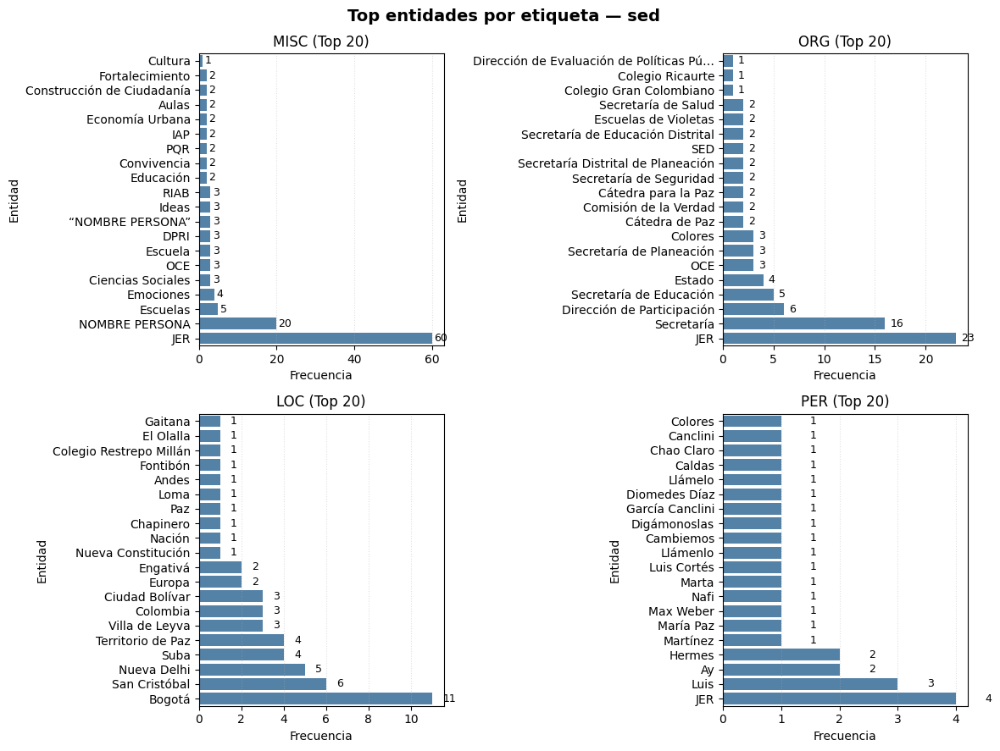

In [87]:
plot_top_entities_by_label(df_entities, "sed", top_n=20, max_labels_per_fig=None, cols=2)


En la entrevistas de SED, en MISC sobresalen JER y el placeholder NOMBRE PERSONA (anonimización), seguidos por rótulos técnico-institucionales (Escuelas, Emociones, Ciencias Sociales, OCE, DPRI, RIAB, PQR, IAP), lo que revela documentos y entrevistas centrados en líneas, instrumentos y enfoques (convivencia, ciudadanía, aulas) más que en casos particulares. En ORG la jerarquía la encabezan JER, Secretaría/Dirección de Participación y Secretaría de Educación, con menciones a Estado, OCE, Cátedra/Comisión de la Paz, Salud y Planeación; esto perfila una articulación intersectorial (educación–salud–planeación–paz) y una gestión con órganos y programas definidos. En LOC el anclaje es Bogotá con presencia de San Cristóbal, Suba, Ciudad Bolívar, Engativá, y lugares simbólicos (Territorio de Paz), lo que indica despliegue territorial en varias localidades, aunque sin granularidad por institución. En PER aparecen pocos nombres y varios ruidos (interjecciones, apellidos aislados), más bien residuales frente al sesgo institucional. En conjunto, SED habla desde la implementación de política (JER como eje), con coordinación de direcciones y enfoque territorial en Bogotá.

## 2. Normalización

En base a lo anterior se decide hacer una normalización de los textos dado que es un paso importante al momento de hacer una nube de palabras para poder identificar la frecuencia/relevancia de las palabras en los textos. En concreto, se “limpia” cada documento quitando HTML, enlaces y correos, corrigiendo comillas/guiones raros, eliminando caracteres extraños, unificando mayúsculas a minúsculas (con excepciones para siglas claves como SED o JER) y ordenando los espacios. Con esto reducimos el ruido, evitamos contar como diferentes cosas que en realidad son la misma (“Justicia”, “justicia”, “justicia.”) y logramos frecuencias más fieles y comparables entre fuentes.

In [31]:
import re, unicodedata
from ftfy import fix_text
from bs4 import BeautifulSoup
from html import unescape

URL_RE    = re.compile(r'https?://\S+|www\.\S+', re.IGNORECASE)
EMAIL_RE  = re.compile(r'\b[\w\.-]+@[\w\.-]+\.\w+\b')
ZW_RE     = re.compile(r'[\u200B-\u200D\uFEFF]')             # zero-width
QUOTE_RE  = re.compile(r'[“”«»]')                            # → "
DASH_RE   = re.compile(r'[–—]')                              # → -
HTML_TAGS = re.compile(r'<[^>]+>')

KEEP_CHARS_RE = re.compile(r"[^0-9A-Za-zÁÉÍÓÚÜÑáéíóúüñ\.\,\;\:\?\!\(\)\"\'\-\%\_\s]")

def strip_html(text: str) -> str:
    if "<" in text and ">" in text:
        return BeautifulSoup(text, "html.parser").get_text(" ")
    return text

def normalize_unicode(text: str, form="NFKC") -> str:
    s = fix_text(text)
    s = unescape(s)
    s = unicodedata.normalize(form, s)
    s = QUOTE_RE.sub('"', s)
    s = DASH_RE.sub('-', s)
    s = ZW_RE.sub('', s)
    return s

def lowercase_controlled(text: str, keep_words=None) -> str:
    """
    Minúsculas controladas:
    - Convierte a minúsculas
    - Restaura mayúsculas para palabras de una whitelist (siglas, nombres de programa)
    """
    if not keep_words:
        return text.lower()
    keep = {w.lower(): w for w in keep_words}  
    lowered = text.lower()
    def repl(m):
        w = m.group(0)
        return keep.get(w, w)
    return re.sub(r"\b\w+\b", repl, lowered, flags=re.UNICODE)

def normalize_light(text: str, keep_words=None) -> str:
    """
    - Corrige unicode
    - Quita HTML, URLs y emails
    - Mantiene tildes/ñ y signos clave
    - Minúsculas controladas (con whitelist opcional)
    """
    if text is None:
        return ""
    s = str(text)
    s = strip_html(s)
    s = normalize_unicode(s)
    s = URL_RE.sub(" ", s)
    s = EMAIL_RE.sub(" ", s)
    s = KEEP_CHARS_RE.sub(" ", s)
    s = lowercase_controlled(s, keep_words=keep_words)
    s = re.sub(r"\s+", " ", s).strip()
    return s


In [32]:
normalized_data_experiencias = normalize_light(data_experiencias)
normalized_data_manuales = normalize_light(data_manuales)
normalized_data_documentos_institucionales = normalize_light(data_documentos_institucionales)
normalized_data_estudiantes = normalize_light(data_estudiantes)
normalized_data_anexo_estudiantes = normalize_light(data_anexo_estudiantes)
normalized_data_directivos = normalize_light(data_directivos)
normalized_data_docentes = normalize_light(data_docentes)
normalized_data_familia = normalize_light(data_familia)
normalized_data_sed = normalize_light(data_sed)

## 3. Nube de palabras unigrama

Se realizó un análisis a través de un unigrama mediante una nube de palabras. Para ver la frecuencia de las palabras.

### 3.1. Implementacion

In [33]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/juanperez/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [34]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from nltk.corpus import stopwords

# --- Helper: quitar acentos (para crear variantes) ---
def strip_accents(s: str) -> str:
    return "".join(
        c for c in unicodedata.normalize("NFD", s)
        if unicodedata.category(c) != "Mn"
    )

def with_accent_variants(words):
    """Devuelve el set con originales + versiones sin acentos."""
    out = set(words)
    out.update(strip_accents(w) for w in words)
    return out

# --- Construcción del set de stopwords ---
nltk_es = set(stopwords.words("spanish"))
wc_base = set(STOPWORDS)

domain_terms = {
    "jer", "sed", "colegio", "colegios", "bogotá", "bogota",
    "estudiante", "estudiantes", "docente", "docentes",
    "localidad", "localidades", "sede", "sedes"
}

spanish_stopwords = with_accent_variants(nltk_es | wc_base | domain_terms)

def plot_wordcloud(text, title):
    if not isinstance(text, str) or len(text.strip()) == 0:
        print(f"[Aviso] Texto vacío para: {title}")
        return
    sample = text
    wc = WordCloud(
        width=1000,
        height=600,
        background_color='white',
        stopwords=spanish_stopwords,
        collocations=False,
        prefer_horizontal=0.9
    ).generate(sample)
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

### 3.2. Analisis

#### 3.2.1. Experiencias

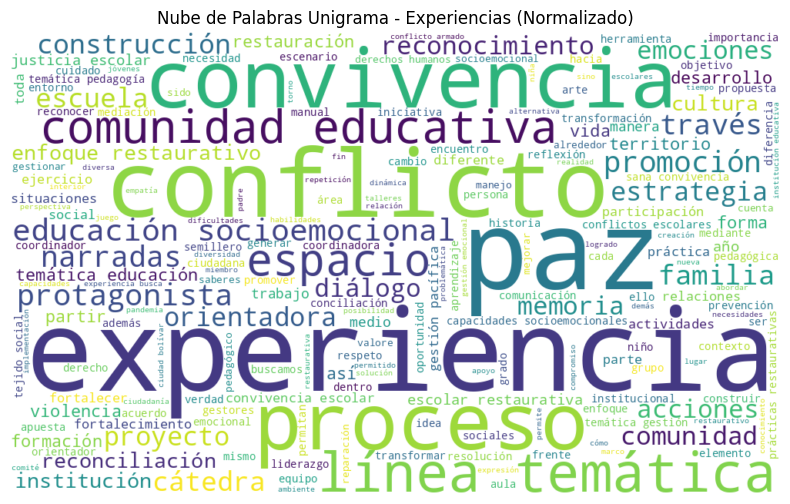

In [88]:
plot_wordcloud(normalized_data_experiencias, 'Nube de Palabras Unigrama - Experiencias (Normalizado)')

Sugiere un relato centrado en convivencia, conflicto y paz, con fuerte anclaje en experiencia, proceso y comunidad educativa; aparecen de forma destacada términos propios del enfoque restaurativo y pedagógico como diálogo, reconocimiento, socioemocional, promoción, estrategia, orientación, reconciliación, cátedra y proyecto, junto con referencias a familia y escuela, lo que apunta a prácticas de transformación del conflicto y educación socioemocional más que a un discurso sancionatorio o punitivo.

#### 3.2.2. Manuales

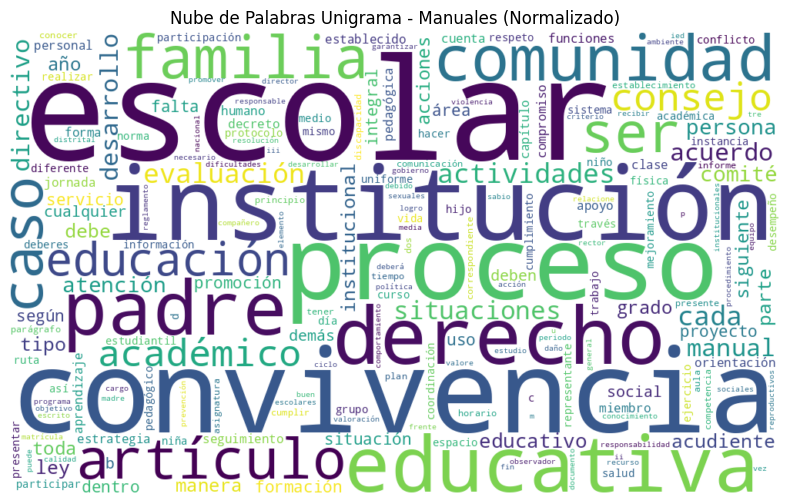

In [36]:
plot_wordcloud(normalized_data_manuales, 'Nube de Palabras Unigrama - Manuales (Normalizado)')

El unigrama de manuales muestra un discurso marcadamente normativo-institucional: predominan institución/escolar, proceso, derecho, artículo, consejo/comité, decreto y evaluación/seguimiento, lo que sitúa la convivencia como un conjunto de reglas, procedimientos y protocolos más que como vivencia socioemocional. Términos como actividades, servicio/atención, proyecto y comunidad indican que la gestión se operacionaliza en acciones y servicios, pero siempre bajo marcos legales y de gobierno escolar. En síntesis, estos manuales priorizan cumplimiento y procedimientos (órganos, artículos, casos, seguimiento) para garantizar la convivencia.

#### 3.2.3. Documentos Institucionales

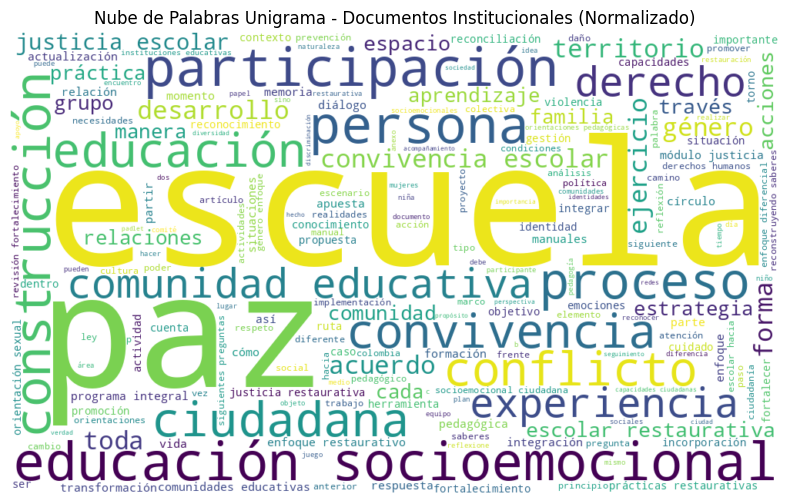

In [89]:
plot_wordcloud(normalized_data_documentos_institucionales, 'Nube de Palabras Unigrama - Documentos Institucionales (Normalizado)')

Predomina un marco formativo de convivencia se articula con educación/educativa, escolar/escuela y la noción de persona/ciudadana, señalando que los documentos institucionales posicionan la convivencia como competencia cívica y ética más que como trámite normativo. La presencia fuerte de restaurativa, socioemocional, participación y comunidad indica enfoque en transformación del conflicto mediante habilidades emocionales y acciones colectivas. Términos como justicia, paz, derecho y género muestran un anclaje en derechos y enfoque diferencial. Palabras operativas como práctica, construcción, proceso, saberes, espacio sugieren implementación a través de prácticas pedagógicas (p. ej., círculos, actividades) integradas al currículo y a la vida escolar. En conjunto, estos textos pintan una institución que busca formar ciudadanía y reparar vínculos mediante pedagogías restaurativas e inclusión.

#### 3.2.4. Entrevistas Estudiantes

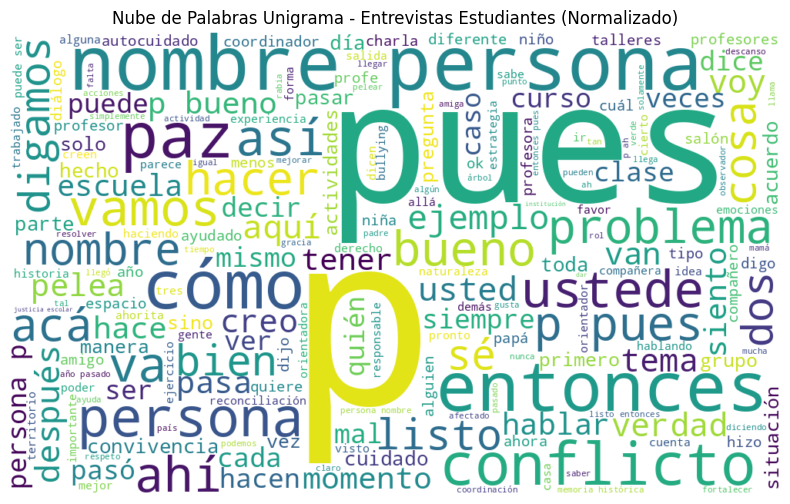

In [90]:
plot_wordcloud(normalized_data_estudiantes, 'Nube de Palabras Unigrama - Entrevistas Estudiantes (Normalizado)')


El unigrama de entrevistas a estudiantes evidencia un registro conversacional y situacional: dominan marcadores discursivos y muletillas (pues, entonces, bueno, digamos, listo, como) y deícticos (aquí, ahí, este), señal de relatos orales, espontáneos y anclados a episodios concretos. Aparecen referencias a la escuela/profe/coordinación, lo que ubica los hechos en la vida escolar y su gestión. En conjunto, los estudiantes describen situaciones puntuales y relacionales más que marcos normativos.

#### 3.2.5. Anexo Estudiantes

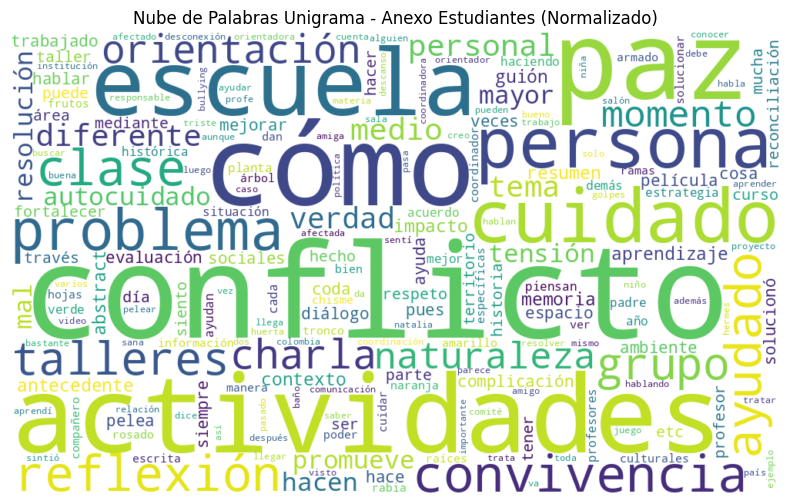

In [39]:
plot_wordcloud(normalized_data_anexo_estudiantes, 'Nube de Palabras Unigrama - Anexo Estudiantes (Normalizado)')


El anexo de estudiantes enfatiza un enfoque didáctico y de cuidado, dominan cómo, actividades, talleres, reflexión, orientación y ayudado, lo que revela materiales que guían pasos y prácticas más que solo narrar hechos. El eje conflicto, paz/convivencia se mantiene, pero atravesado por competencias de cuidado y verdad/reconciliación, apuntando a reparación de vínculos.

#### 3.2.6. Entrevistas Directivos

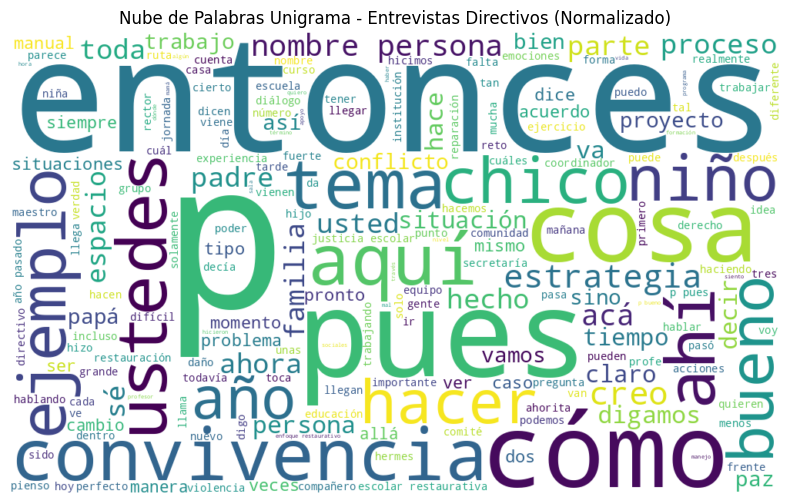

In [91]:
plot_wordcloud(normalized_data_directivos, 'Nube de Palabras Unigrama - Entrevistas Directivos (Normalizado)')


Discurso de directivos con marco operativo y de gestión donde abundan muletillas conversacionales (entonces, pues, bueno) pero el léxico dominante es procedimental (cómo, hace, proceso, estrategia, tema, ejemplo), señal de foco en resolver casos y estandarizar formas de hacer. Se visibiliza una mirada de responsabilidad: constante referencia a la persona/niño/chico, uso de usted/ustedes (interpelación directiva), y mención de familia como co-actor. La convivencia aparece asociada a espacios/tiempos (aquí, acá, ahora, día, año) y a acciones concretas (dice, hace, vamos), lo que sugiere gestión situacional con seguimiento temporal.


#### 3.2.7. Entrevistas Docentes

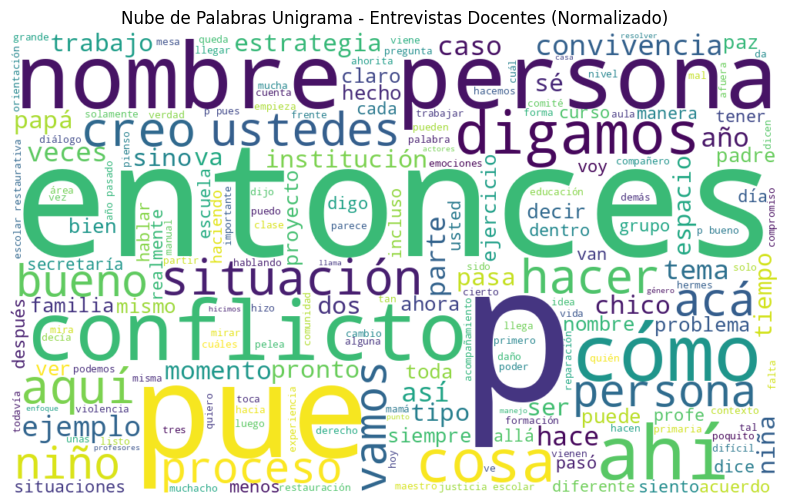

In [92]:
plot_wordcloud(normalized_data_docentes, 'Nube de Palabras Unigrama - Entrevistas Docentes (Normalizado)')


En los docentes predomina un registro conversacional con muletillas (entonces, pues, digamos) pero el foco es operativo: cómo, hacer, proceso, situación. El sujeto central es la persona/niño/niña y aparece la familia como co-actor, lo que revela una mirada relacional y de corresponsabilidad. Los aquí, acá, ahí, ahora anclan relatos a escenas concretas de aula/patio y a la temporalidad escolar (año, veces, después), sugiriendo gestión situacional y repetitiva de casos. 

#### 3.2.8. Entrevistas Familia

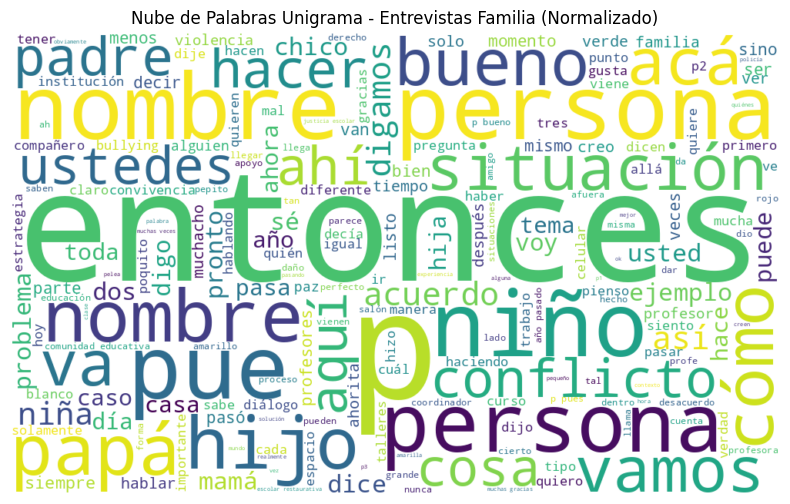

In [93]:
plot_wordcloud(normalized_data_familia, 'Nube de Palabras Unigrama - Entrevistas Familia (Normalizado)')

En familias el discurso es altamente personal y situacional: predominan referencias directas a hijo/niño/niña, papá/mamá/padres y a nombres, lo que indica individualización del caso y fuerte centralidad afectiva. Abundan muletillas (entonces, pues, aquí, acá, ahí) que anclan relatos a episodios inmediatos, con léxico de acción y trámite (hacer, decir, vamos) y marcadores temporales (momento, día, año) que sugieren foco en resolución pronta y seguimiento. La presencia de conflicto/problema con acuerdo muestra una orientación a salidas negociadas, mientras el uso de ustedes señala expectativa de respuesta institucional  y corresponsabilidad.

#### 3.2.9. Entrevistas SED

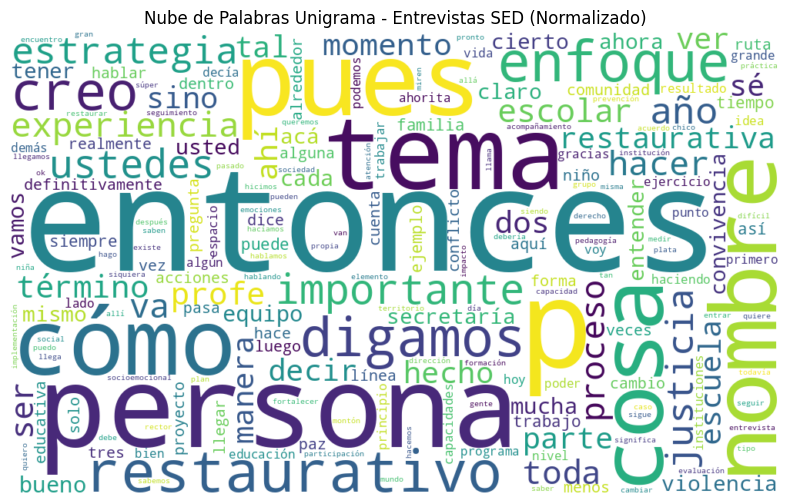

In [43]:
plot_wordcloud(normalized_data_sed, 'Nube de Palabras Unigrama - Entrevistas SED (Normalizado)')


En SED predomina un discurso programático  hablan en clave de enfoque/estrategia y proceso, con fuerte anclaje en lo restaurativo como marco rector, y referencias a equipo, ruta/plan y acompañamiento/prevención. La centralidad de persona indica orientación a sujetos y no solo a procedimientos, El uso de muletillas (entonces, pues, cómo) confirma tono conversacional, pero el léxico dominante apunta a alineación de políticas y traducción operativa del enfoque restaurativo hacia la escuela y la comunidad.

## 4. Bigrama

### 4.1. Implementación

In [94]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from nltk.corpus import stopwords

# --- Helper: quitar acentos (para crear variantes) ---
def strip_accents(s: str) -> str:
    return "".join(
        c for c in unicodedata.normalize("NFD", s)
        if unicodedata.category(c) != "Mn"
    )

def with_accent_variants(words):
    """Devuelve el set con originales + versiones sin acentos."""
    out = set(words)
    out.update(strip_accents(w) for w in words)
    return out

# --- Construcción del set de stopwords ---
nltk_es = set(stopwords.words("spanish"))
wc_base = set(STOPWORDS)

domain_terms = {
    "jer", "sed", "colegio", "colegios", "bogotá", "bogota",
    "estudiante", "estudiantes", "docente", "docentes",
    "localidad", "localidades", "sede", "sedes"
}

spanish_stopwords = with_accent_variants(nltk_es | wc_base | domain_terms)

def plot_wordcloud(text, title):
    if not isinstance(text, str) or len(text.strip()) == 0:
        print(f"[Aviso] Texto vacío para: {title}")
        return
    sample = text
    wc = WordCloud(
        width=1000,
        height=600,
        background_color='white',
        stopwords=spanish_stopwords,
        collocations=True,
        prefer_horizontal=0.9
    ).generate(sample)
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

### 4.2. Analisis

#### 4.2.1. Experiencias

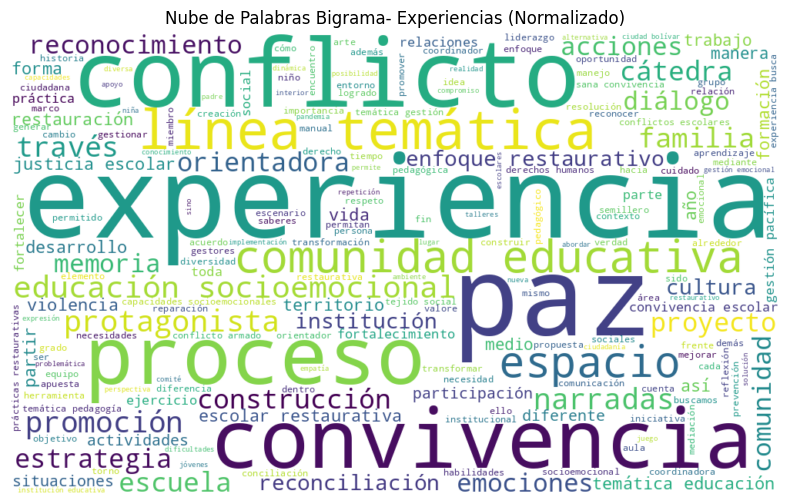

In [95]:
plot_wordcloud(normalized_data_experiencias, 'Nube de Palabras Bigrama- Experiencias (Normalizado)')

Refuerza un relato pedagógico–restaurativo centrado en conflicto–paz–convivencia tramitados mediante proceso y experiencia dentro de la comunidad educativa: aparecen combinaciones como línea temática, cátedra de paz, educación socioemocional, diálogo y reconocimiento, junto a orientadora/orientación, proyecto y espacio, lo que sugiere foco en prácticas y dispositivos formativos (no sancionatorios) y en habilidades socioemocionales. El vocabulario compuesto prioriza acciones pedagógicas y marcos restaurativos (cátedra, línea temática, proyectos, reconocimiento/diálogo) para transformar el conflicto en paz y convivencia

#### 4.2.2. Manuales

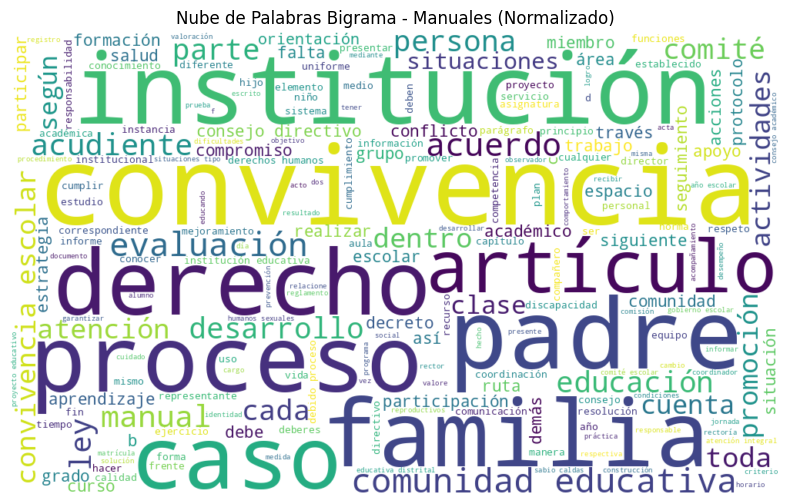

In [46]:
plot_wordcloud(normalized_data_manuales, 'Nube de Palabras Bigrama - Manuales (Normalizado)')

Sugiere un enfoque marcadamente institucional y normativo sobre la convivencia: destacan “institución”, “artículo”, “derecho”, “decreto/ley” y “manual”, indicando marco reglamentario y procedimientos formales; aparece con fuerza la gestión de casos y procesos (“proceso”, “caso”, “evaluación”, “acuerdo”, “seguimiento”), lo que apunta a rutas operativas para resolver conflictos; se refuerza la corresponsabilidad familia-escuela mediante “padre”, “acudiente”, “familia” y “comunidad educativa”; figuran estructuras de gobernanza escolar como “comité” y “consejo directivo”; y emergen líneas de promoción y cuidado (“promoción”, “atención”, “salud”, “desarrollo”, “educación”), con menciones a inclusión (“discapacidad”). Estos patrones reflejan que los manuales priorizan reglas, roles y procedimientos para garantizar la convivencia.

4.2.3. Documentos institucionales

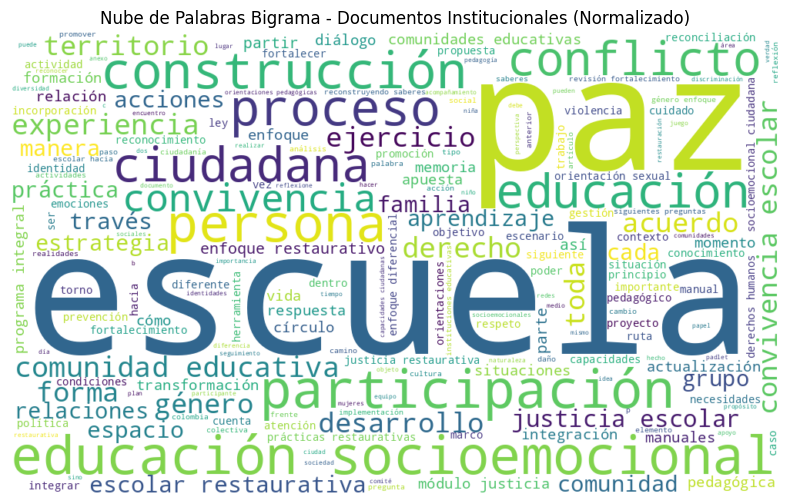

In [47]:
plot_wordcloud(normalized_data_documentos_institucionales, 'Nube de Palabras Bigrama - Documentos Institucionales (Normalizado)')

En los documentos institucionales normalizados, se ve un énfasis programático en una escuela orientada a la paz y la convivencia, con fuerte presencia de participación (ciudadana/estudiantil), educación socioemocional, y construcción (de paz/comunidad) como ejes articuladores; aparecen proceso, conflicto y círculo (lectura compatible con prácticas restaurativas) junto con comunidad educativa, persona y familia, lo que sugiere un enfoque integral “toda la escuela” que combina formación en ciudadanía, manejo/transformación de conflictos y desarrollo socioemocional.

#### 4.2.4. Entrevistas estudiantes

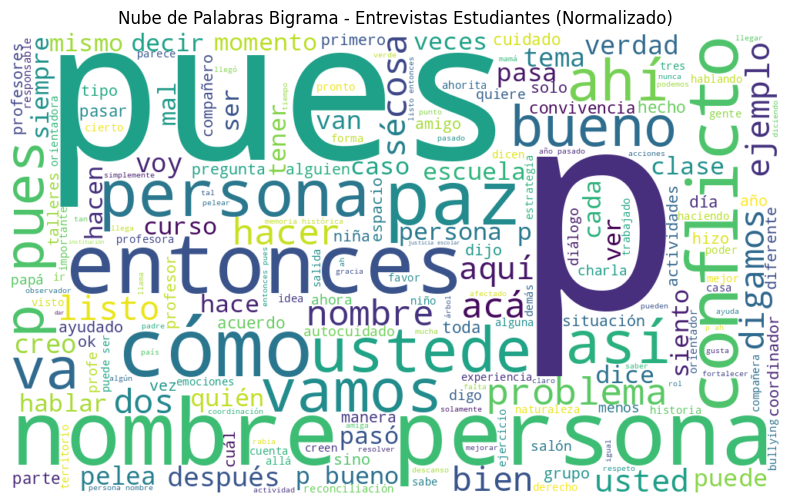

In [48]:
plot_wordcloud(normalized_data_estudiantes, 'Nube de Palabras Bigrama - Entrevistas Estudiantes (Normalizado)')

Abundan muletillas y conectores (“pues”, “entonces”, “ahí”, “así”), formas de interpelación y diálogo (“usted”, “vamos”, “cómo”, “quién”), y marcadores de inmediatez temporal/espacial (“ahí”, “acá”, “después”, “momento”, “clase”, “salón”), lo que sugiere relatos en primera experiencia más que lenguaje normativo.  Palabras con conotacion negativa como pelea, bullying, conflicto reflejan directamente sentimientos de los estudiantes.

#### 4.2.5. Anexo Estudiantes

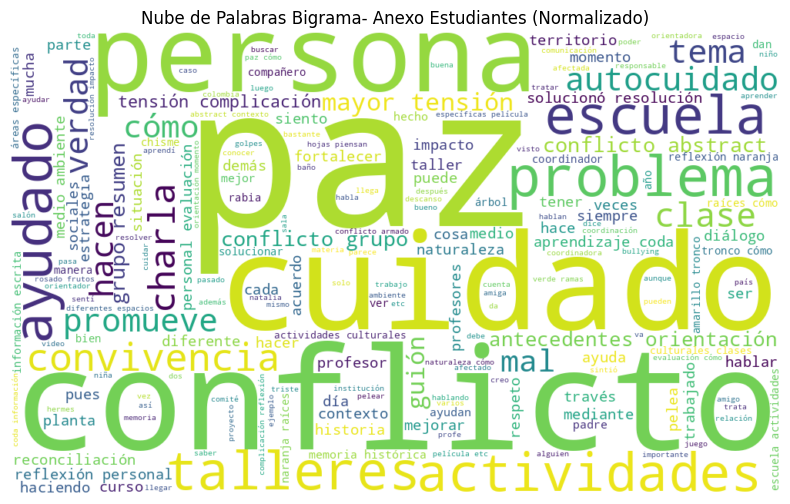

In [49]:
plot_wordcloud(normalized_data_anexo_estudiantes, 'Nube de Palabras Bigrama- Anexo Estudiantes (Normalizado)')


Dominan paz, cuidado/autocuidado y conflicto junto con talleres, actividades, charla, orientación y resoluciones, lo que sugiere intervenciones concretas (formación, acompañamiento, diálogo) orientadas a la gestión del conflicto y al bienestar en la escuela/clase. Aparecen problema/tema, tensión y contexto, indicando reconocimiento de situaciones críticas y su abordaje situacional; y términos como ayuda, profesor, grupo, convivencia y persona apuntan a dinámicas colectivas donde mediación y apoyo docente son centrales

#### 4.2.6. Entrevistas directivos

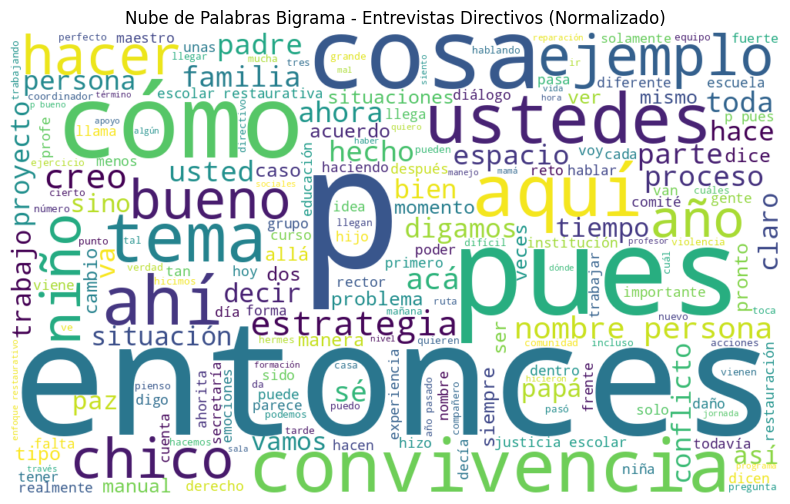

In [96]:
plot_wordcloud(normalized_data_directivos, 'Nube de Palabras Bigrama - Entrevistas Directivos (Normalizado)')


Abundan muletillas y deícticos (“entonces”, “pues”, “aquí”, “ahí”, “cómo”), junto con marcadores de interpelación colectiva (“ustedes”, “usted”), lo que sugiere diálogo operativo y toma de decisiones en contexto. Palabras con fuerza como convivencia, estrategia, proceso, proyecto y manual, indicando un enfoque en gestión institucional de la convivencia (procedimientos, lineamientos, seguimiento). La presencia de familia/padre/hijo apunta a articulación escuela–hogar en la resolución de situaciones y casos, mientras términos como ejemplo, tipo, tema, año/hoy/cambio reflejan comunicación situada, con referencias temporales

#### 4.2.7. Entrevistas Docentes

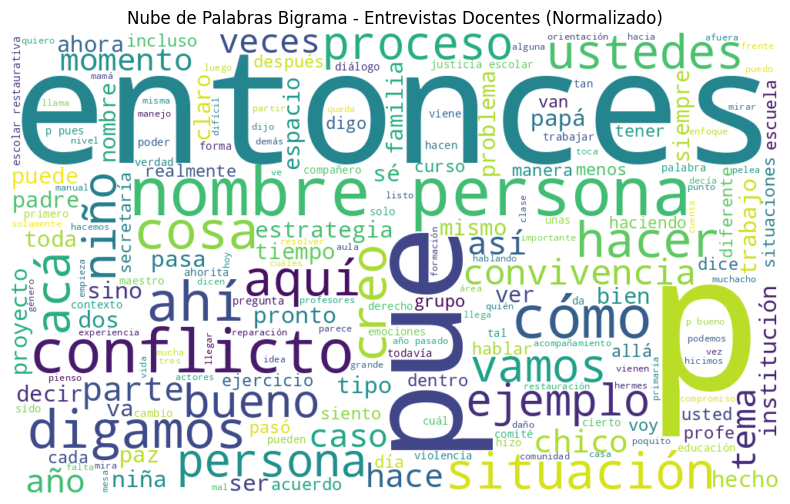

In [51]:
plot_wordcloud(normalized_data_docentes, 'Nube de Palabras Bigrama - Entrevistas Docentes (Normalizado)')

Predominan muletillas y deícticos (“entonces”, “pues”, “aquí/ahí”), interpelaciones a grupo (“ustedes”, “vamos”) y verbos de acción (“hacer”, “ver”), lo que sugiere relatos de práctica cotidiana más que discurso normativo. Dominancia en palabras como proceso, convivencia, conflicto y situación/caso, indicando foco en gestión de casos y toma de decisiones en aula/escuela; aparecen ejemplo, tipo, parte y referencias temporales (“año”, “momento”, “después”), propias de la narración de incidentes. La mención a familia/papá apunta a coordinación escuela–hogar. La etiqueta nombre_persona confirma anonimización consistente.

#### 4.2.8. Familia

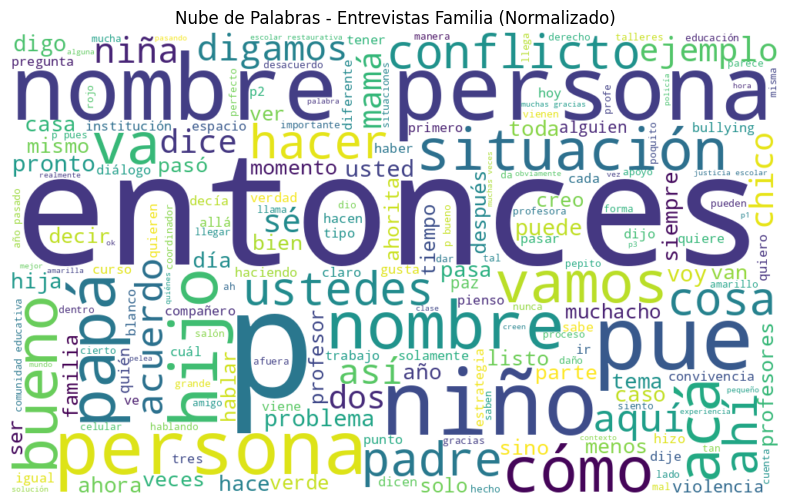

In [52]:
plot_wordcloud(normalized_data_familia, 'Nube de Palabras - Entrevistas Familia (Normalizado)')

Se centra en hijos/as: predominan niño/niña, junto con papá/mamá/padre, y verbos de acción (hacer, vamos) que describen situaciones concretas; hay ocurrencias en conflicto y persona, lo que sugiere relatos de interacción con pares y escuela; aparecen muletillas y deícticos (entonces, pues, aquí/ahí, cómo) y la etiqueta nombre_persona confirma anonimización consistente.

#### 4.2.9. SED

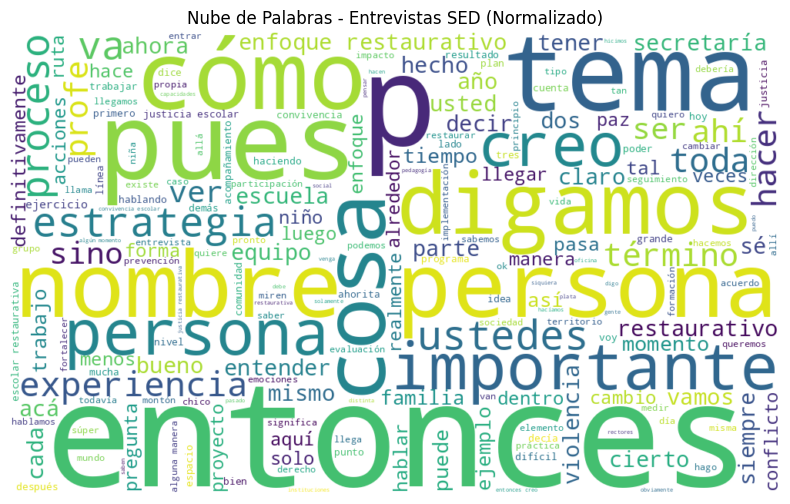

In [53]:
plot_wordcloud(normalized_data_sed, 'Nube de Palabras - Entrevistas SED (Normalizado)')

Hay marcadores conversacionales (pues, entonces, cómo, digamos) con léxico de gestión pública (estrategia, proceso, proyecto, enfoque restaurativo, implementación), además de términos evaluativos (importante, experiencia, resultado), lo que sugiere que la SED enmarca la convivencia desde planes y metodologías más que desde casos puntuales; aparecen escuela, familia y violencia, indicando articulación interinstitucional y foco preventivo